In [2]:
!pip install lda

In [3]:
!pip install jieba

In [4]:
import lda

In [5]:
import pandas as pd
print(pd.__version__)

2024-05-29 21:41:49,562 : INFO : NumExpr defaulting to 8 threads.


2.2.2


In [6]:
import numpy as np

In [7]:
import re

In [8]:
file_path = '/Users/wxxh/Desktop/data_cleaned_05_21.csv'
data = pd.read_csv(file_path)

In [1]:
from gensim.corpora import Dictionary
from gensim.models import LdaModel
from gensim.models import CoherenceModel
import matplotlib.pyplot as plt

# Optional: Set logging to see Gensim's processing messages (e.g., training progress)
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

In [9]:
import jieba

# List of words you want to add
words_to_add = ['花西子', '回怼', '空气质量', '微博热搜','热搜','掉粉','打工人','打工','李佳琦','带货','主播','红人','网红','薇娅']

# Adding words to jieba's dictionary with optional frequency and part of speech
for word in words_to_add:
    jieba.add_word(word, freq=None, tag=None)

Building prefix dict from the default dictionary ...
2024-05-29 21:42:01,123 : DEBUG : Building prefix dict from the default dictionary ...
Dumping model to file cache /var/folders/wp/6z7t0vks5xld4746tdcwghfh0000gn/T/jieba.cache
2024-05-29 21:42:01,799 : DEBUG : Dumping model to file cache /var/folders/wp/6z7t0vks5xld4746tdcwghfh0000gn/T/jieba.cache
Loading model cost 0.744 seconds.
2024-05-29 21:42:01,869 : DEBUG : Loading model cost 0.744 seconds.
Prefix dict has been built successfully.
2024-05-29 21:42:01,870 : DEBUG : Prefix dict has been built successfully.


In [10]:
def segment_chinese(text):
    return list(jieba.cut(text))

In [11]:
# Apply the segmentation function to each row in the 'text' column
data['segmented_text'] = data['text'].apply(segment_chinese)

In [12]:
random_sample = data['segmented_text'].sample(n=50, random_state=52)
print(random_sample)

4418                       [花西子,  , 花西子, 眉笔, 79,  ,  , ​]
2601    [ , 感觉, 最近, 直播, 带货, 出, 了, 不少, 事, ，, 是不是, 下, 一步...
3891    [做生意, 是, 百米, 跑, ，, 做, 品牌, 则, 是, 马拉松, 。, 猜测, 可能...
529     [可是, 他, 说, 的, 这段话, 真的, 很, 伤人, 心, 社会, 上, 并, 不是,...
1049                [你, 能, 接受, 李佳琦, 的, 道歉, 吗, ？, 🙉,  , ​]
2161    [李佳琦, 这次, 的, 言论, 为何, 引起, 巨大, 争论,  ,  , 也许, 就是,...
4235    [蜂花, ：, 听, 我, 说, 谢谢, 你, 因为, 有, 你, ，, 我, 的, 李佳琦...
1758    [怎么, 铺天盖地, 都, 在, 说, 花西子, 的, 这款, 眉, 粉笔, 比, 黄金, ...
4787    [“, 非常, 抱歉, ，, 占用, 了, 过, 多, 的, 公共资源, 。, ”, 不知,...
2257    [今晚, 好多, 贵妇, 品没上, ..., 李佳琦, 都, 急, 哭, 了, ...,  ...
4855    [有些, 人, 总是, 担心, 别人, 口袋, 里, 的, 钱, 花错, 地方,  , 2,...
1434    [倒, 是, 大可不必, ，, 想想, 在, 直播间, 买, 他, 商品, 的, 顾客, 有...
3158    [评, “, 当初, 拿不出, 两万块, 学费, 的, 原因, 找到, 了, ，, 肯定, ...
2828    [说, 的, 对, ✓, ✓, ✓, 资本家, 对, 工人阶级, 的, 掠夺, ，, 是, ...
781     [做, 回, “, 真实, 自己, ”, 的, 李佳琦, ，, 怼, 了, 万千, 的, 网...
2364           [ , 李佳琦, 在, 直播, 中哭, 着, 向, 大家, 道歉, ！,  , ​]
4592          [我, 被, 李佳琦, 的, 猪猪, 女孩, 们, 骂, 惨, 了,  ,  , ​]
962     [李佳琦, 

In [13]:
# Path to your stop words file
stop_words_file = '/Users/wxxh/Desktop/stopword.txt'

In [14]:
# Load stop words from the file into a set
with open(stop_words_file, 'r', encoding='utf-8') as file:
    stop_words = set(file.read().strip().split('\n'))

In [15]:
# Print some of the stop words to confirm
print(list(stop_words)[:10])

['陈年', '接著', '［②ｅ］', '从速', '—', '即若', '没奈何', '６', '以来', '又']


In [16]:
# Function to remove stop words
def remove_stop_words(words):
    return [word for word in words if word not in stop_words]

In [17]:
# Apply the function to the segmented text
data['cleaned_text'] = data['segmented_text'].apply(remove_stop_words)

In [18]:
# Create a Gensim dictionary from the cleaned texts
dictionary = Dictionary(data['cleaned_text'])

# Filter out extremes to limit the number of features
dictionary.filter_extremes(no_below=5, no_above=0.5, keep_n=100000)

# Create a Gensim corpus using the dictionary
corpus = [dictionary.doc2bow(text) for text in data['cleaned_text']]

2024-05-29 21:43:25,583 : INFO : adding document #0 to Dictionary<0 unique tokens: []>
2024-05-29 21:43:25,793 : INFO : built Dictionary<23896 unique tokens: [' ', '\u200b', '原因', '多年', '好意思']...> from 5013 documents (total 199601 corpus positions)
2024-05-29 21:43:25,794 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<23896 unique tokens: [' ', '\\u200b', '原因', '多年', '好意思']...> from 5013 documents (total 199601 corpus positions)", 'datetime': '2024-05-29T21:43:25.794819', 'gensim': '4.3.0', 'python': '3.11.7 (main, Dec 15 2023, 12:09:04) [Clang 14.0.6 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}
2024-05-29 21:43:25,815 : INFO : discarding 19274 tokens: [(' ', 4960), ('\u200b', 3422), ('李佳琦', 3323), ('具象化', 3), ('别太爱', 1), ('面刺', 1), ('摊位费', 2), ('特惠', 1), ('还少', 2), ('卖乖', 2)]...
2024-05-29 21:43:25,816 : INFO : keeping 4622 tokens which were in no less than 5 and no more than 2506 (=50.0%) documents
2024-05-29 21:43:25,827 : INFO : resulting dict

In [19]:
# Create a Gensim dictionary from the cleaned texts
dictionary = Dictionary(data['cleaned_text'])

# Filter out extremes to limit the number of features
dictionary.filter_extremes(no_below=5, no_above=0.5, keep_n=100000)

# Create a Gensim corpus using the dictionary
corpus = [dictionary.doc2bow(text) for text in data['cleaned_text']]

2024-05-29 21:43:44,490 : INFO : adding document #0 to Dictionary<0 unique tokens: []>
2024-05-29 21:43:44,697 : INFO : built Dictionary<23896 unique tokens: [' ', '\u200b', '原因', '多年', '好意思']...> from 5013 documents (total 199601 corpus positions)
2024-05-29 21:43:44,698 : INFO : Dictionary lifecycle event {'msg': "built Dictionary<23896 unique tokens: [' ', '\\u200b', '原因', '多年', '好意思']...> from 5013 documents (total 199601 corpus positions)", 'datetime': '2024-05-29T21:43:44.698754', 'gensim': '4.3.0', 'python': '3.11.7 (main, Dec 15 2023, 12:09:04) [Clang 14.0.6 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}
2024-05-29 21:43:44,718 : INFO : discarding 19274 tokens: [(' ', 4960), ('\u200b', 3422), ('李佳琦', 3323), ('具象化', 3), ('别太爱', 1), ('面刺', 1), ('摊位费', 2), ('特惠', 1), ('还少', 2), ('卖乖', 2)]...
2024-05-29 21:43:44,719 : INFO : keeping 4622 tokens which were in no less than 5 and no more than 2506 (=50.0%) documents
2024-05-29 21:43:44,730 : INFO : resulting dict

In [22]:
# Set the number of topics
num_topics = 8

# Train the LDA model
lda_model = LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics,
                     random_state=100, update_every=1, chunksize=100, 
                     passes=10, alpha='auto', eta='auto')

2024-05-29 21:44:47,832 : INFO : using autotuned alpha, starting with [0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125]
2024-05-29 21:44:47,835 : INFO : using serial LDA version on this node
2024-05-29 21:44:47,840 : INFO : running online (multi-pass) LDA training, 8 topics, 10 passes over the supplied corpus of 5013 documents, updating model once every 100 documents, evaluating perplexity every 1000 documents, iterating 50x with a convergence threshold of 0.001000
2024-05-29 21:44:47,840 : INFO : PROGRESS: pass 0, at document #100/5013
2024-05-29 21:44:47,906 : INFO : optimized alpha [0.08433512, 0.089085974, 0.11384087, 0.09012526, 0.11719947, 0.10153425, 0.096764825, 0.12403278]
2024-05-29 21:44:47,908 : INFO : merging changes from 100 documents into a model of 5013 documents
2024-05-29 21:44:47,916 : INFO : topic #0 (0.084): 0.029*"品牌" + 0.027*"工资" + 0.026*"工作" + 0.025*"多年" + 0.023*"涨" + 0.022*"花西子" + 0.020*"找" + 0.019*"眉笔" + 0.019*"没涨" + 0.018*"反思"
2024-05-29 21:44:47,917 :

In [23]:
# Display topics
for i, topic in lda_model.show_topics(formatted=True, num_topics=num_topics, num_words=10):
    print("Topic {}: \n{}".format(i, topic))
    print("\n")

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data['cleaned_text'].tolist(), dictionary=dictionary, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

2024-05-29 21:45:38,251 : INFO : using ParallelWordOccurrenceAccumulator<processes=7, batch_size=64> to estimate probabilities from sliding windows


Topic 0: 
0.036*"蜂花" + 0.034*"宣传" + 0.023*"行业" + 0.018*"流量" + 0.017*"市场" + 0.016*"美妆" + 0.015*"高端" + 0.014*"成分" + 0.013*"新" + 0.011*"这是"


Topic 1: 
0.046*"医生" + 0.021*"社会" + 0.015*"里" + 0.014*"大众" + 0.013*"价值" + 0.013*"原料" + 0.012*"真" + 0.011*"关系" + 0.011*"吸引" + 0.010*"风波"


Topic 2: 
0.073*"网友" + 0.031*"日" + 0.030*"找" + 0.030*"工资" + 0.022*"称" + 0.022*"公关" + 0.021*"回应" + 0.018*"舆论" + 0.018*"有没有" + 0.018*"工作"


Topic 3: 
0.033*"公司" + 0.031*"亿" + 0.025*"企业" + 0.024*"哭" + 0.017*" " + 0.015*"操作" + 0.014*"医院" + 0.014*"掉" + 0.013*"虚假" + 0.011*"有限公司"


Topic 4: 
0.233*"花西子" + 0.121*"品牌" + 0.110*"国货" + 0.019*"产品" + 0.014*"打工人" + 0.013*"翻车" + 0.012*"包装" + 0.012*"老板" + 0.009*"走" + 0.008*"旗舰店"


Topic 5: 
0.046*"说" + 0.035*"努力" + 0.017*"真的" + 0.017*"钱" + 0.016*"道歉" + 0.015*"做" + 0.015*"想" + 0.014*"直播" + 0.012*"赚" + 0.010*"工作"


Topic 6: 
0.041*"收入" + 0.029*"中国" + 0.025*"中" + 0.018*"头部" + 0.017*"时代" + 0.015*"一种" + 0.015*"成本" + 0.014*"不到" + 0.014*"普通人" + 0.014*"卖点"


Topic 7: 
0.040*"眉笔" + 0.034*"

2024-05-29 21:45:40,595 : INFO : 7 accumulators retrieved from output queue
2024-05-29 21:45:40,643 : INFO : accumulated word occurrence stats for 33954 virtual documents



Coherence Score:  0.38680428004751327


2024-05-29 21:46:13,332 : INFO : using autotuned alpha, starting with [1.0]
2024-05-29 21:46:13,334 : INFO : using serial LDA version on this node
2024-05-29 21:46:13,336 : INFO : running online (multi-pass) LDA training, 1 topics, 10 passes over the supplied corpus of 5013 documents, updating model once every 100 documents, evaluating perplexity every 1000 documents, iterating 50x with a convergence threshold of 0.001000
2024-05-29 21:46:13,338 : INFO : PROGRESS: pass 0, at document #100/5013
2024-05-29 21:46:13,356 : INFO : optimized alpha [1.0]
2024-05-29 21:46:13,357 : INFO : merging changes from 100 documents into a model of 5013 documents
2024-05-29 21:46:13,358 : INFO : topic #0 (1.000): 0.026*"说" + 0.026*"贵" + 0.021*"消费者" + 0.020*"找" + 0.020*"工资" + 0.019*"工作" + 0.016*"花西子" + 0.016*"多年" + 0.015*"眉笔" + 0.015*"网友"
2024-05-29 21:46:13,359 : INFO : topic diff=3.177175, rho=1.000000
2024-05-29 21:46:13,362 : WARNING : updated prior is not positive
2024-05-29 21:46:13,363 : INFO : PRO

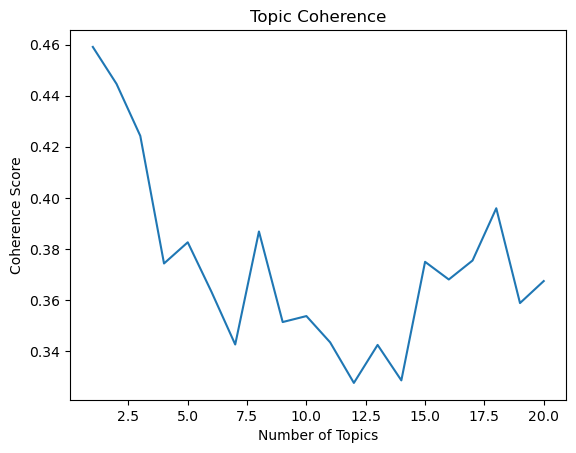

In [24]:
def calculate_coherence(dictionary, corpus, texts, limit):
    coherence_values = []
    model_list = []
    for num_topics in range(1, limit + 1):
        model = LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics, random_state=100,
                         update_every=1, chunksize=100, passes=10, alpha='auto', eta='auto')
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

# Calculate coherence scores for up to 20 topics
model_list, coherence_values = calculate_coherence(dictionary, corpus, data['cleaned_text'].tolist(), 20)
x = range(1, 21)
plt.plot(x, coherence_values)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score")
plt.title("Topic Coherence")
plt.show()

In [25]:
optimal_model = model_list[8-1]  # Python uses zero-based indexing

In [36]:
def format_topics_sentences(lda_model, corpus, texts):
    # Initialize the DataFrame inside the function to ensure it's in the correct scope
    sent_topics = pd.DataFrame()

    # Loop through each document in the corpus
    for i, row_list in enumerate(lda_model[corpus]):
        # Assuming lda_model.per_word_topics might give more refined topic-word distributions
        row = row_list[0] if lda_model.per_word_topics else row_list
        
        # Sort topics in the document by their contribution (descending order)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        
        # Get top three topics (if there are at least three)
        top_topics = row[:3]
        
        # Collect topic numbers and their contributions
        topics_nums = []
        props = []
        keywords = []
        for j, (topic_num, prop_topic) in enumerate(top_topics):
            wp = lda_model.show_topic(topic_num)
            topic_keywords = ", ".join([word for word, prop in wp])
            topics_nums.append(int(topic_num))
            props.append(round(prop_topic, 4))
            keywords.append(topic_keywords)
        
        # Create a DataFrame for the new row: we adjust the columns to hold all three topics
        if len(topics_nums) == 3:
            new_row = pd.DataFrame([topics_nums + props + keywords],
                                   columns=['Topic_Num1', 'Topic_Num2', 'Topic_Num3', 
                                            'Prop_Topic1', 'Prop_Topic2', 'Prop_Topic3',
                                            'Topic_Keywords1', 'Topic_Keywords2', 'Topic_Keywords3'])
        else:
            # Handle cases where there are less than three topics
            filler = [None] * (9 - len(topics_nums) * 3)  # Adjust the filler size appropriately
            new_row = pd.DataFrame([topics_nums + props + keywords + filler],
                                   columns=['Topic_Num1', 'Topic_Num2', 'Topic_Num3', 
                                            'Prop_Topic1', 'Prop_Topic2', 'Prop_Topic3',
                                            'Topic_Keywords1', 'Topic_Keywords2', 'Topic_Keywords3'])

        # Use concat to add the new row
        sent_topics = pd.concat([sent_topics, new_row], ignore_index=True)

    # Return the populated DataFrame from the function
    return sent_topics

# Assuming 'lda_model', 'corpus', and 'texts' are already defined
# Call the function with appropriate arguments
resulting_sent_topics = format_topics_sentences(lda_model, corpus, data['text'].tolist())
print(resulting_sent_topics.head())

   Topic_Num1  Topic_Num2  Topic_Num3  Prop_Topic1  Prop_Topic2  Prop_Topic3  \
0           2           5           7       0.4278       0.2384       0.1107   
1           2           7           5       0.4513       0.1779       0.1267   
2           7           2           5       0.4534       0.1487       0.1391   
3           2           7           5       0.3302       0.1970       0.1424   
4           5           7           2       0.2477       0.2057       0.1880   

                          Topic_Keywords1  \
0    网友, 日, 找, 工资, 称, 公关, 回应, 舆论, 有没有, 工作   
1    网友, 日, 找, 工资, 称, 公关, 回应, 舆论, 有没有, 工作   
2  眉笔, 消费者, 直播间, 买, 主播, 79, 元, 产品, 直播, 带货   
3    网友, 日, 找, 工资, 称, 公关, 回应, 舆论, 有没有, 工作   
4       说, 努力, 真的, 钱, 道歉, 做, 想, 直播, 赚, 工作   

                          Topic_Keywords2  \
0       说, 努力, 真的, 钱, 道歉, 做, 想, 直播, 赚, 工作   
1  眉笔, 消费者, 直播间, 买, 主播, 79, 元, 产品, 直播, 带货   
2    网友, 日, 找, 工资, 称, 公关, 回应, 舆论, 有没有, 工作   
3  眉笔, 消费者, 直播间, 买, 主播, 79, 元, 产品, 直播, 带货   
4  眉笔, 消费者, 直播间, 买, 主播,

In [40]:
# Add original text to the DataFrame
contents = pd.DataFrame(data['text'].tolist(), columns=['Original_Text'])
resulting_sent_topics = pd.concat([resulting_sent_topics, contents], axis=1)

# Print the resulting DataFrame to verify
print(resulting_sent_topics.head())

   Topic_Num1  Topic_Num2  Topic_Num3  Prop_Topic1  Prop_Topic2  Prop_Topic3  \
0           2           5           7       0.4278       0.2384       0.1107   
1           2           7           5       0.4513       0.1779       0.1267   
2           7           2           5       0.4534       0.1487       0.1391   
3           2           7           5       0.3302       0.1970       0.1424   
4           5           7           2       0.2477       0.2057       0.1880   

                          Topic_Keywords1  \
0    网友, 日, 找, 工资, 称, 公关, 回应, 舆论, 有没有, 工作   
1    网友, 日, 找, 工资, 称, 公关, 回应, 舆论, 有没有, 工作   
2  眉笔, 消费者, 直播间, 买, 主播, 79, 元, 产品, 直播, 带货   
3    网友, 日, 找, 工资, 称, 公关, 回应, 舆论, 有没有, 工作   
4       说, 努力, 真的, 钱, 道歉, 做, 想, 直播, 赚, 工作   

                          Topic_Keywords2  \
0       说, 努力, 真的, 钱, 道歉, 做, 想, 直播, 赚, 工作   
1  眉笔, 消费者, 直播间, 买, 主播, 79, 元, 产品, 直播, 带货   
2    网友, 日, 找, 工资, 称, 公关, 回应, 舆论, 有没有, 工作   
3  眉笔, 消费者, 直播间, 买, 主播, 79, 元, 产品, 直播, 带货   
4  眉笔, 消费者, 直播间, 买, 主播,

In [41]:
# Save the DataFrame to a new CSV file
resulting_sent_topics.to_csv('/Users/wxxh/Desktop/enriched_dataset.csv', index=False, encoding='utf-8')

In [31]:
pip install pyLDAvis

Note: you may need to restart the kernel to use updated packages.


In [1]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis

# Preparing the visualization
pyLDAvis.enable_notebook()
vis_data = gensimvis.prepare(optimal_model, corpus, dictionary)

# Displaying the interactive visualization in a Jupyter Notebook
pyLDAvis.display(vis_data)

NameError: name 'optimal_model' is not defined

In [33]:
# Save the visualization as an HTML file
pyLDAvis.save_html(vis_data, 'lda_visualization.html')